## Download UNI weights

In [1]:
## Downloading UNI2

import timm
import torch
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
from huggingface_hub import login, hf_hub_download
import os
from torchvision import transforms
import plotnine as p9
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from scipy.ndimage import distance_transform_edt

In [2]:
# pretrained=True needed to load UNI weights (and download weights for the first time)
# using UNI2-h as example
timm_kwargs = {
   'model_name': 'vit_giant_patch14_224',
   'img_size': 224, 
   'patch_size': 14, 
   'depth': 24,
   'num_heads': 24,
   'init_values': 1e-5, 
   'embed_dim': 1536,
   'mlp_ratio': 2.66667*2,
   'num_classes': 0, 
   'no_embed_class': True,
   'mlp_layer': timm.layers.SwiGLUPacked, 
   'act_layer': torch.nn.SiLU, 
   'reg_tokens': 8, 
   'dynamic_img_size': True
  }
local_dir = "./assets/ckpts/uni2-h/"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = timm.create_model(**timm_kwargs)
model.load_state_dict(torch.load(os.path.join(local_dir, "pytorch_model.bin"), map_location=device), strict=True)
model = model.to(device)
transform = transforms.Compose(
 [
  transforms.Resize(224),
  transforms.CenterCrop(224),
  transforms.ToTensor(),
  transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
 ]
)
model.eval()

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 1536, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=1536, out_features=4608, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=1536, out_features=1536, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
      (mlp): GluMlp(
        (fc1): Linear(in_features=1536, out_features=8192, bias=True)
        (act): SiLU()
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): Identity()
    

In [3]:
transform = transforms.Compose(
 [
  transforms.Resize(224),
  transforms.CenterCrop(224),
  transforms.ToTensor(),
  transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
 ]
)
model.eval()
transform

Compose(
    Resize(size=224, interpolation=bilinear, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
)

## Load the data

In [4]:
from PIL import Image
import pandas as pd
import numpy as np
import ast
from sklearn.decomposition import PCA

In [5]:
image_path = "/p/project1/hai_fzj_bda/berr1/Data/atlas_images"
img = Image.open(os.path.join(image_path, "100960033.jpg"))
img = transform(img).unsqueeze(dim=0)
img.shape, img.min(), img.max()

(torch.Size([1, 3, 224, 224]), tensor(0.0651), tensor(2.5703))

In [6]:
img.shape

torch.Size([1, 3, 224, 224])

In [7]:
csv_path = "/p/project1/hai_fzj_bda/berr1/Data/full_data.csv"
df = pd.read_csv(csv_path).drop(columns=('Unnamed: 0'))
df.head(5)

,image_id,patchsize,center_ccf,pixel_coord,distance,nearest_ST,nearest_cell_id,target_atlas_plate,distance_new,x,y,z,x_st,y_st,z_st,image_nr,brain_area,group
0,100960033_0,256,"{'x': 9041.303566238017, 'y': 608.440707597615...","{'center_x': 3600, 'center_y': 750, 'x_min': 3...",[26.96708369],"{'x': 9.015563342479185, 'y': 0.60248181810300...",1018093344101020093-5,79.0,26.967084,9041.303566,608.440708,3534.729786,9.015563,0.602482,3.529330,100960033,Isocortex,11
1,100960033_1,256,"{'x': 9040.470157758366, 'y': 600.007102468515...","{'center_x': 3750, 'center_y': 750, 'x_min': 3...",[22.98267593],"{'x': 9.022008108505569, 'y': 0.58650415560821...",1018093344101020202-2,79.0,22.982676,9040.470158,600.007102,3695.788856,9.022008,0.586504,3.693547,100960033,Isocortex,11
2,100960033_2,256,"{'x': 9039.636749278714, 'y': 591.573497339415...","{'center_x': 3900, 'center_y': 750, 'x_min': 3...",[14.82009286],"{'x': 9.02670894770029, 'y': 0.589438277502603...",1018093344101170064-1,79.0,14.820093,9039.636749,591.573497,3856.847926,9.026709,0.589438,3.863772,100960033,Isocortex,11
3,100960033_3,256,"{'x': 9038.803340799064, 'y': 583.139892210315...","{'center_x': 4050, 'center_y': 750, 'x_min': 3...",[8.56962813],"{'x': 9.03243164589604, 'y': 0.578710641440339...",1018093344101170223-6,79.0,8.569628,9038.803341,583.139892,4017.906997,9.032432,0.578711,4.021543,100960033,Isocortex,11
4,100960033_4,256,"{'x': 9037.969932319413, 'y': 574.706287081215...","{'center_x': 4200, 'center_y': 750, 'x_min': 4...",[9.55449462],"{'x': 9.036470863139728, 'y': 0.58401252390542...",1018093344101170438-3,79.0,9.554495,9037.969932,574.706287,4178.966067,9.036471,0.584013,4.177406,100960033,Isocortex,11


### Try to use this for one sample image (100960033)

In [8]:
df_sample = df[df.image_id.str.startswith("100960033")]
df_sample.shape

(2104, 18)

In [9]:
df_sample.patchsize.unique()

array([256])

In [10]:
df_sample.loc[0, "pixel_coord"]

"{'center_x': 3600, 'center_y': 750, 'x_min': 3472, 'x_max': 3728, 'y_min': 622, 'y_max': 878}"

In [11]:
# ==> Only have patch sizes of 256

In [12]:
img_sample = np.array(Image.open(os.path.join(image_path, "100960033.jpg")))
img_sample.shape

(7872, 10800, 3)

In [13]:
df_sample["pixel_coord"][0]

"{'center_x': 3600, 'center_y': 750, 'x_min': 3472, 'x_max': 3728, 'y_min': 622, 'y_max': 878}"

### Transform into patches

In [15]:
patches_sample = []
half_size = 224 // 2  # Half the patch size (112)
for centroid in df_sample["pixel_coord"]:
    centroid = ast.literal_eval(centroid)
    x = centroid["center_x"]
    y = centroid["center_y"]

    x_start, x_end = max(x - half_size, 0), min(x + half_size, img_sample.shape[1])
    y_start, y_end = max(y - half_size, 0), min(y + half_size, img_sample.shape[0])

    # Extract patch and pad if necessary
    patch = img_sample[y_start:y_end, x_start:x_end]
    if patch.shape != (224, 224, 3):
        print(centroid, patch.shape)
    patches_sample.append(patch)
    
patches_sample = np.array(patches_sample)
patches_sample.shape

(2104, 224, 224, 3)

### Use UNI

In [18]:
my_transform = transforms.Normalize(
    mean=(0.485, 0.456, 0.406), 
    std=(0.229, 0.224, 0.225)
)
img_trans = torch.tensor(patches_sample).permute(0, 3, 1, 2).type(torch.float32)
img_trans = my_transform(img_trans)

ind = 2104  # To fit into CUDA

print(img_trans.shape)
with torch.inference_mode():
 features_sample = model(img_trans[0:ind])

torch.Size([2104, 3, 224, 224])


In [22]:
latent_sample = np.load("embeddings/100960033.npy")
latent_sample.shape

(2104, 1536)

In [19]:
latent_sample = features_sample.cpu().detach().numpy()
np.save("embeddings/100960033.npy", latent_sample)
latent_sample

array([[ 0.01915874,  0.9034669 , -0.43040562, ...,  0.21218918,
        -0.19956473, -0.53060156],
       [ 0.02333414,  0.88657904, -0.43555856, ...,  0.19942887,
        -0.17510508, -0.5402534 ],
       [ 0.03728584,  0.9191901 , -0.4941668 , ...,  0.23171477,
        -0.14484423, -0.49577975],
       ...,
       [-0.01249983,  0.9959215 , -0.5286424 , ...,  0.32614315,
        -0.02587148, -0.46663433],
       [-0.02012364,  0.9817062 , -0.5042282 , ...,  0.3499505 ,
        -0.04589364, -0.44066358],
       [ 0.01702902,  0.93677586, -0.48462674, ...,  0.2831829 ,
        -0.10054238, -0.48811272]], dtype=float32)

## Plot with extra info from the df

In [25]:
df_sample["brain_area"].value_counts()

brain_area
RHP             613
MB              565
Isocortex       451
HB              255
white_matter    141
HIP              64
TH                7
HY                5
ventricle         3
Name: count, dtype: int64

In [26]:
pca = PCA(2)
pca_sample = pd.DataFrame(pca.fit_transform(latent_sample), columns = ("PCA1", "PCA2"))
pca_sample["brain_area"] = df_sample["brain_area"]
pca_sample.shape

(2104, 3)

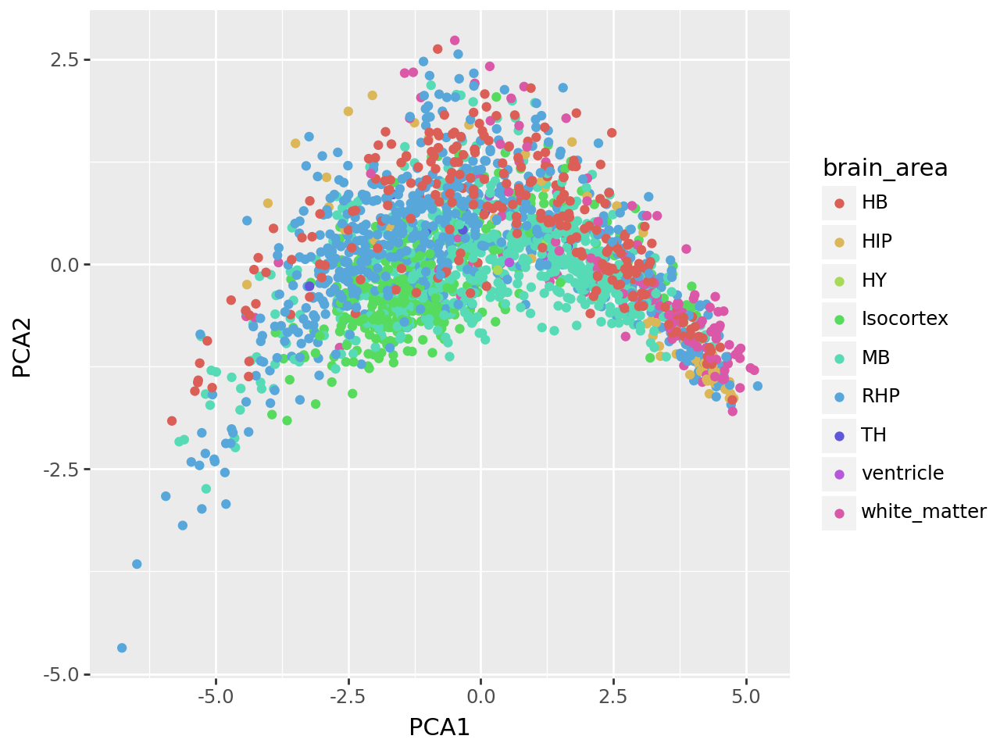

In [27]:
# PLot the PCA
plot = (p9.ggplot(pca_sample, p9.aes(x="PCA1", y="PCA2", color = "brain_area")) +
        p9.geom_point()
       )
plot

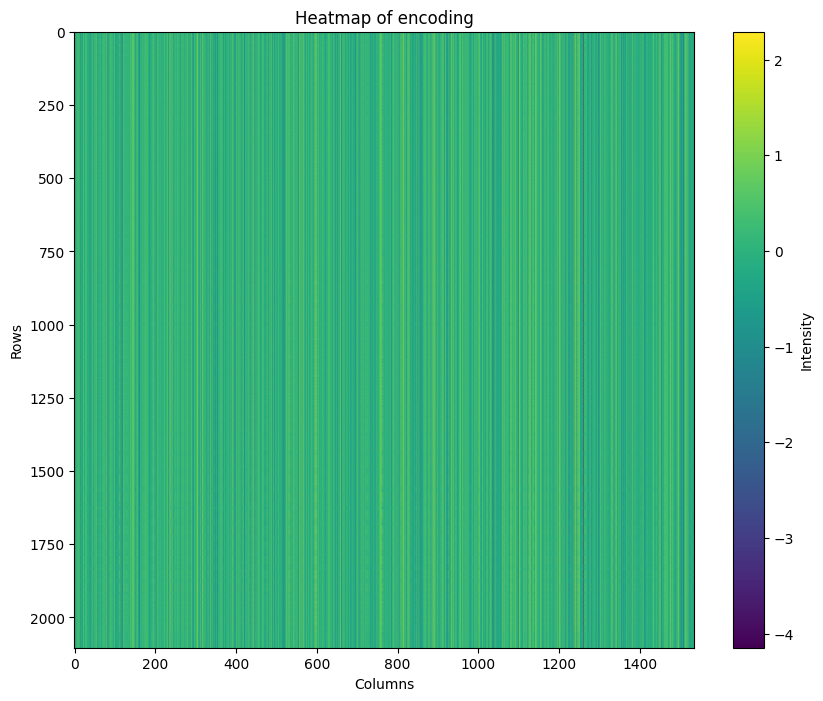

In [28]:
# Plot using imshow
plt.figure(figsize=(10, 8))  # Adjust size
plt.imshow(latent_sample, cmap="viridis", aspect="auto")  # Use "viridis" or another colormap
plt.colorbar(label="Intensity")  # Add a colorbar
plt.title("Heatmap of encoding")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()


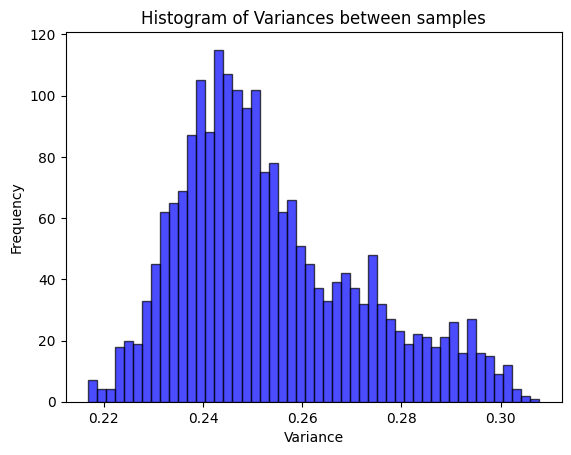

In [29]:
variances = np.var(latent_sample, axis = 1)
plt.hist(variances, bins=50, color="blue", edgecolor="black", alpha=0.7)
plt.xlabel("Variance")
plt.ylabel("Frequency")
plt.title("Histogram of Variances between samples")
plt.show()

## Train a classifier

In [81]:
# Train-test split
y = df_sample["brain_area"]
X_train, X_test, y_train, y_test = train_test_split(latent_sample, y, test_size=0.2, stratify=y, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

clf = LogisticRegression(solver='lbfgs', class_weight='balanced', max_iter=500)
clf.fit(X_train, y_train)

# Evaluate model
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          HB       0.74      0.73      0.73        51
         HIP       0.38      0.38      0.38        13
          HY       0.00      0.00      0.00         1
   Isocortex       0.76      0.77      0.76        90
          MB       0.76      0.72      0.74       113
         RHP       0.66      0.65      0.66       123
          TH       0.00      0.00      0.00         1
   ventricle       0.00      0.00      0.00         1
white_matter       0.33      0.46      0.39        28

    accuracy                           0.68       421
   macro avg       0.40      0.41      0.41       421
weighted avg       0.68      0.68      0.68       421



/p/project1/hai_fzj_bda/koenig8/jupyter/kernels/uni/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
/p/project1/hai_fzj_bda/koenig8/jupyter/kernels/uni/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/p/project1/hai_fzj_bda/koenig8/jupyter/kernels/uni/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in label

In [82]:
accuracy_score(y_test, y_pred)

0.6769596199524941

The embeddings do contain enough information to discriminate between the brain areas, especially for those where the support is high enough. But nevertheless, the embeddings are very similar between one another (variance between 0 and 0.02 within sample and ~0.25 between samples). Maybe if we increase the patch size we can have more information for each prediction.

In [36]:
boundaries_sample

[{'center_x': 3600,
  'center_y': 750,
  'x_min': 3472,
  'x_max': 3728,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 3750,
  'center_y': 750,
  'x_min': 3622,
  'x_max': 3878,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 3900,
  'center_y': 750,
  'x_min': 3772,
  'x_max': 4028,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 4050,
  'center_y': 750,
  'x_min': 3922,
  'x_max': 4178,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 4200,
  'center_y': 750,
  'x_min': 4072,
  'x_max': 4328,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 4350,
  'center_y': 750,
  'x_min': 4222,
  'x_max': 4478,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 4500,
  'center_y': 750,
  'x_min': 4372,
  'x_max': 4628,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 4650,
  'center_y': 750,
  'x_min': 4522,
  'x_max': 4778,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 4800,
  'center_y': 750,
  'x_min': 4672,
  'x_max': 4928,
  'y_min': 622,
  'y_max': 878},
 {'center_x': 5850,
  'center_y': 750,
  'x_mi

## Plot the image with patches

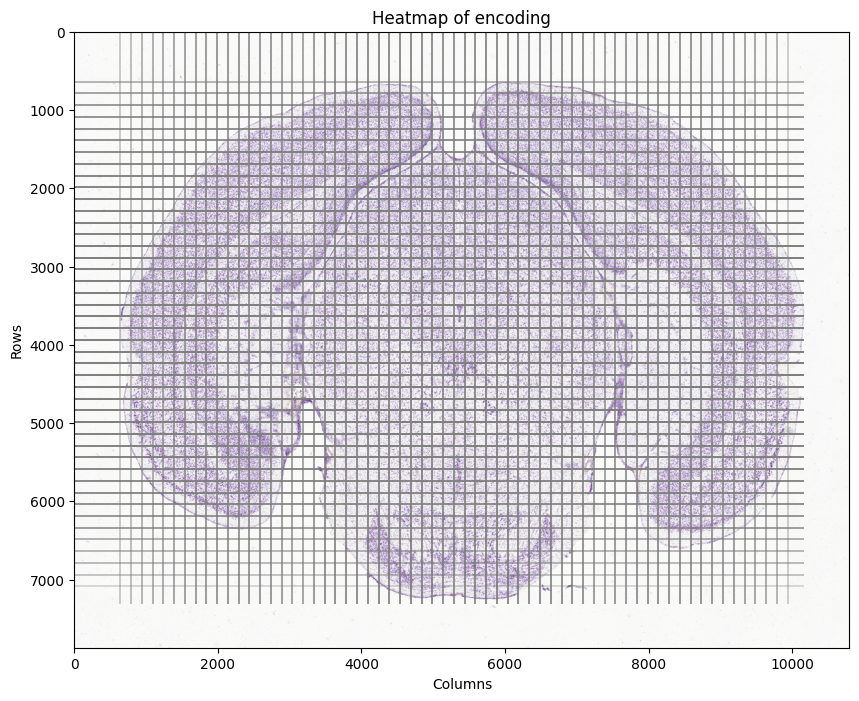

In [32]:
boundaries_sample = [ast.literal_eval(centroid) for centroid in df_sample["pixel_coord"]]
x_sample = [centr["center_x"] - 112 for centr in boundaries_sample]
y_sample = [centr["center_y"] - 112 for centr in boundaries_sample]

plt.figure(figsize=(10, 8))  # Adjust size
plt.imshow(img_sample, aspect="auto")  # Use "viridis" or another colormap
plt.title("Heatmap of encoding")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.hlines(y_sample, 0, max(x_sample) + 224, linewidths = 0.05, colors = "0.5")
plt.vlines(x_sample, 0, max(y_sample) + 224, linewidths = 0.05, colors = "0.5")
plt.show()

## Finding the correct patch size
We want the patches to encompass the thickest layer of the cortex, but not be too big. In mouse, that is the frontal cortex with a thickness of 1.2 - 1.4mm. Lets use 1mm patches. For this sample we know that it is ~9600 microns wide, and it contains 9524 pixels (disregarding the edges that are empty) ==> une pixel is about one micron => Use patch size of 1000, or 1024 for nice numbers. Alternatively use 768 for more conservative evaluation

In [37]:
boundaries_sample[0]

{'center_x': 3600,
 'center_y': 750,
 'x_min': 3472,
 'x_max': 3728,
 'y_min': 622,
 'y_max': 878}

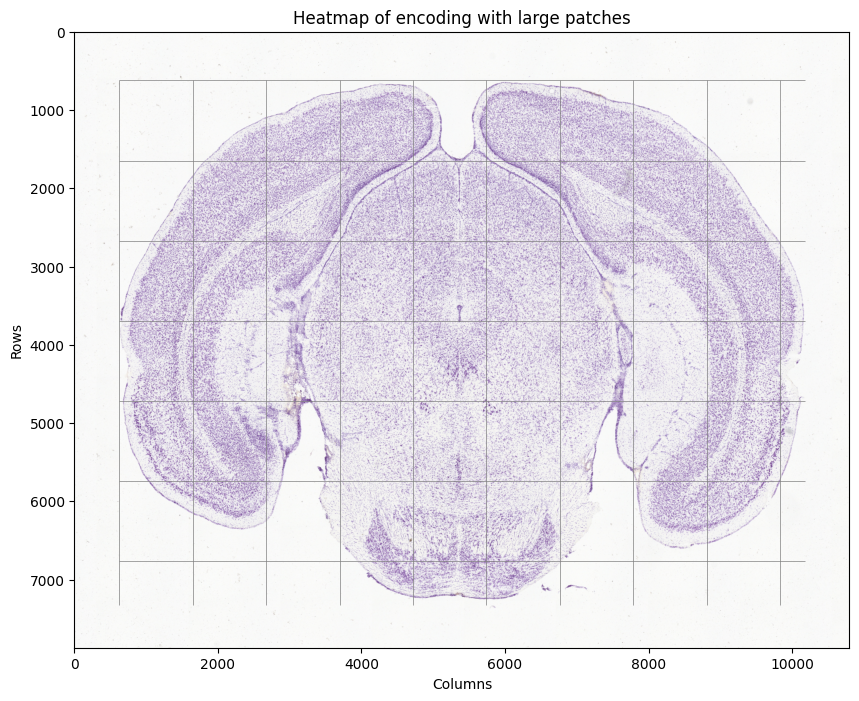

In [44]:
patch_size = 768 ## Try out different patch sizes

min_x = min([centr["x_min"] for centr in boundaries_sample])
max_x = max([centr["x_max"] for centr in boundaries_sample])

min_y = min([centr["y_min"] for centr in boundaries_sample])
max_y = max([centr["y_max"] for centr in boundaries_sample])
x_lines = list(range(min_x, max_x, 1024))
y_lines = list(range(min_y, max_y, 1024))

plt.figure(figsize=(10, 8))  # Adjust size
plt.imshow(img_sample, aspect="auto")  # Use "viridis" or another colormap
plt.title("Heatmap of encoding with large patches")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.hlines(y_lines, min_x, max_x, linewidths = 0.5, colors = "0.5")
plt.vlines(x_lines, min_y, max_y, linewidths = 0.5, colors = "0.5")
plt.show()

These patches are really large, so some smaller brain structures always only take up the minority of the patch. Nevertheless, it might work if the linear classifier can realize what part of the encoding represents the center of the input image
### Retrain with patch size 768 and 1024

In [61]:
def make_patches(pixel_coords, img, patch_size = 224):
    patches_sample = []
    half_size = patch_size // 2  # Half the patch size (112)
    padding_count = 0
    for centroid in pixel_coords:
        centroid = ast.literal_eval(centroid)
        x = centroid["center_x"]
        y = centroid["center_y"]
    
        x_start, x_end = max(x - half_size, 0), min(x + half_size, img.shape[1])
        y_start, y_end = max(y - half_size, 0), min(y + half_size, img.shape[0])
    
        # Extract patch and pad if necessary
        patch = img[y_start:y_end, x_start:x_end]
        if patch.shape != (patch_size, patch_size, 3):
            padding_count += 1
            pad_x = patch_size - (x_end - x_start)
            pad_y = patch_size - (y_end - y_start)
            patch = np.pad(patch, ((0, pad_y), (0, pad_x), (0, 0)), mode='constant')
        patches_sample.append(patch)
        
    patches_sample = np.array(patches_sample)
    print("padded", padding_count, "out of", len(pixel_coords))
    return patches_sample
    
patches_768 = make_patches(df_sample["pixel_coord"], img_sample, 768)
patches_1024 = make_patches(df_sample["pixel_coord"], img_sample, 1024)

padded 0 out of 2104
padded 0 out of 2104


In [66]:
transform(Image.fromarray(patches_768[0])).shape

torch.Size([3, 224, 224])

In [73]:
def uni_forward(X, device = "cuda"):
    N = X.shape[0]
    features = []
    
    for i in tqdm(range(0, N)):
        batch = transform(Image.fromarray(X[i])).unsqueeze(dim=0).to(device=device)
        with torch.inference_mode():
            features.append(model(batch).cpu())

    features = torch.cat(features, dim = 0).detach().cpu().numpy()
    return(features)

features_768 = uni_forward(patches_768, device = device)
features_1024 = uni_forward(patches_1024, device = device)

100%|██████████| 2104/2104 [01:12<00:00, 28.88it/s]


In [74]:
features_768.shape, features_1024.shape

((2104, 1536), (2104, 1536))

In [79]:
# Classify
def log_reg(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    clf = LogisticRegression(solver='lbfgs', class_weight='balanced', max_iter=500)
    clf.fit(X_train, y_train)
    
    # Evaluate model
    y_pred = clf.predict(X_test)
    return(accuracy_score(y_test, y_pred))
log_reg(features_768, df_sample["brain_area"])

0.9406175771971497

In [80]:
log_reg(features_1024, df_sample["brain_area"])

0.9239904988123515

## BUGFIX file 100960098.jpg

In [52]:
bug_file = "100960098"
bug_img = "/p/project1/hai_fzj_bda/berr1/Data/atlas_images/100960098.jpg"
bug_img = np.array(Image.open(bug_img))
bug_img.shape

(3680, 5552, 3)

In [57]:
df.image_id.str.startswith(bug_file).sum()

0

===> Has no entry in csv, skip for now

## Normalizing the image intensities

In [14]:
img_sample.shape, img_sample.min(), img_sample.max()

((7872, 10800, 3), 29, 255)

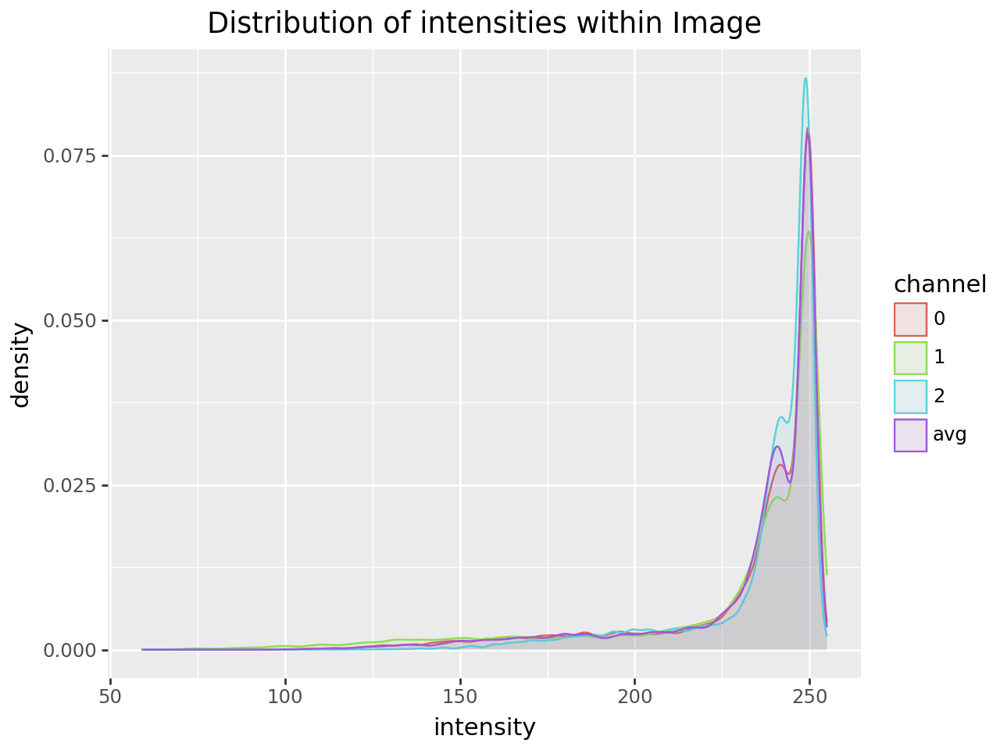

In [15]:
# Plot pixel distributions across the channels
plot_df = []
for i in range(3):
    df_tmp = pd.DataFrame(img_sample[:, :, i].flatten(), columns = ("intensity",)).assign(channel = str(i))
    plot_df.append(df_tmp.sample(n = 10000))
# also average
df_tmp = pd.DataFrame(
    np.average(img_sample, axis = 2).flatten(), columns = ("intensity",)
).assign(channel = "avg")
plot_df.append(df_tmp.sample(n = 10000))
plot_df = pd.concat(plot_df).reset_index(drop = True)
plot = (
    p9.ggplot(plot_df, p9.aes(x = "intensity", color = "channel", fill = "channel"))
    + p9.geom_density(alpha = 0.1)
    + p9.ggtitle("Distribution of intensities within Image")
)
plot

#### The first peak is likely the actual stain, the second the background. Find appropriate value for background

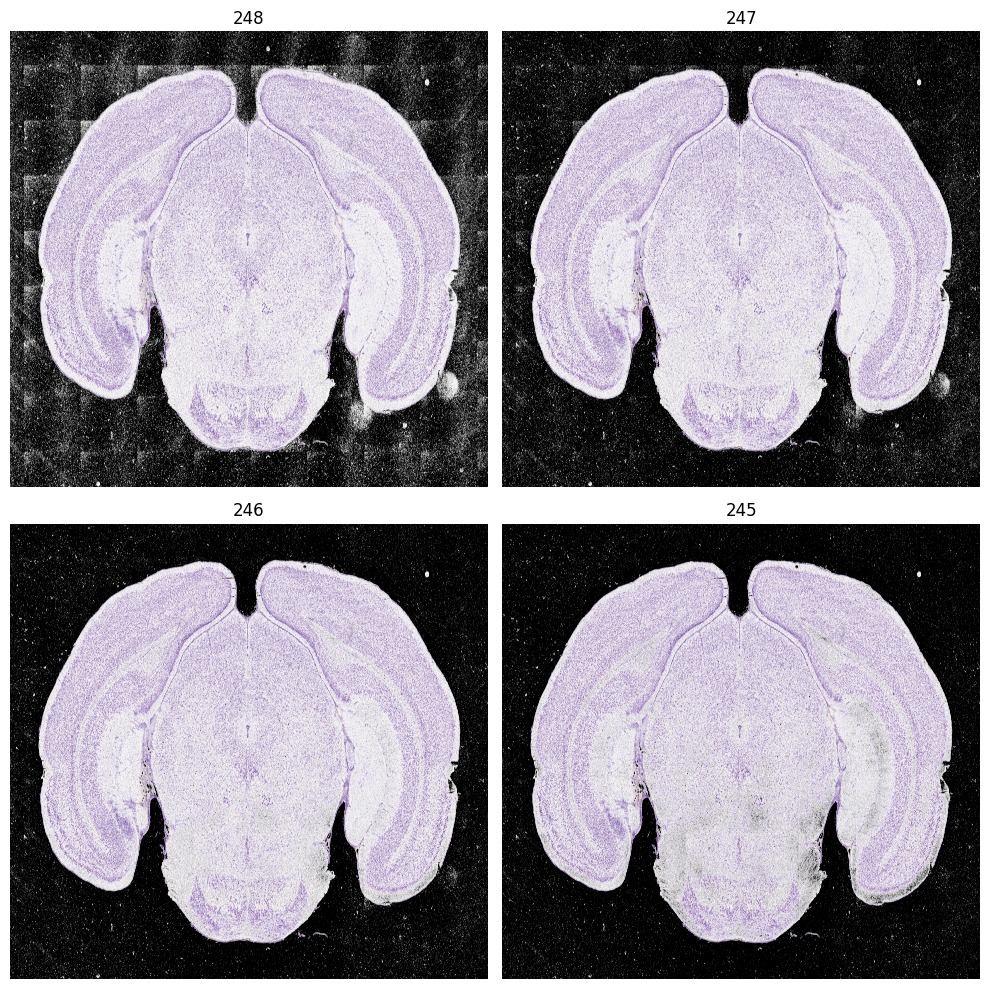

In [47]:
thresholds = (248, 247, 246, 245)
img_avg = np.average(img_sample, axis = 2)
images = []
for t in thresholds:
    img_tmp = img_sample.copy()
    img_tmp[img_avg > t, :] = 0
    images.append(img_tmp)

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
for ax, img, title in zip(axes.ravel(), images, thresholds):
    ax.imshow(img, aspect="auto")  # Display image in grayscale
    ax.set_title(str(title))  # Set title
    ax.axis("off")  # Hide axis labels

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

Based on these plots, we can use an average of 246 across all channels as background discriminator. Lets check if this  is sensible for all images in our datasets (visually)

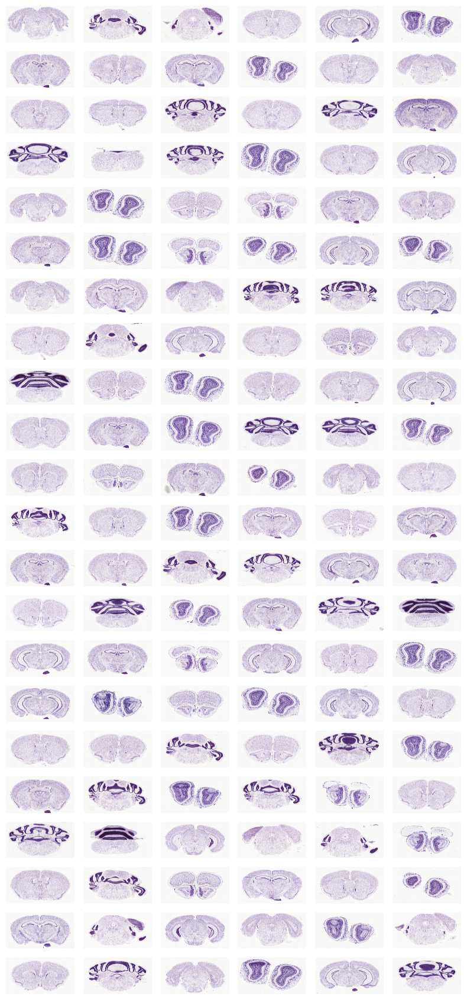

In [55]:
image_path = "/p/project1/hai_fzj_bda/berr1/Data/atlas_images"
images = []
plot_images = []
titles = []
distributions = []
num_bins = 150  # Adjust for resolution
t = 246
for img_path in tqdm(os.listdir(image_path)):
    if img_path.startswith("."):
        continue   
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        img = np.array(Image.open(os.path.join(image_path, img_path)))
        images.append(img)
        
    img_avg = np.average(img, axis = 2)
    img[img_avg > t, :] = 0

    plot_images.append(img)
    titles.append(img_path.split(".")[0])

    counts, bin_edges = np.histogram(img_avg[img_avg <= t], bins=num_bins, density=True)  
    
    # Step 2: Compute bin centers (instead of edges)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Middle of each bin
    
    # Step 3: Convert to DataFrame for `plotnine`
    df_hist_line = pd.DataFrame(
        {"Intensity": bin_centers, "Density": counts}
    ).assign(img = img_path.split(".")[0])
    distributions.append(df_hist_line)

rows, cols = 22, 6
fig, axes = plt.subplots(rows, cols, figsize=(8, 17))  # Adjust figsize for spacing

# Loop through all images and plot them
for ax, img in zip(axes.ravel(), images):
    ax.imshow(img, aspect="auto")  # Display image
    ax.axis("off")  # Remove axis for cleaner look

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

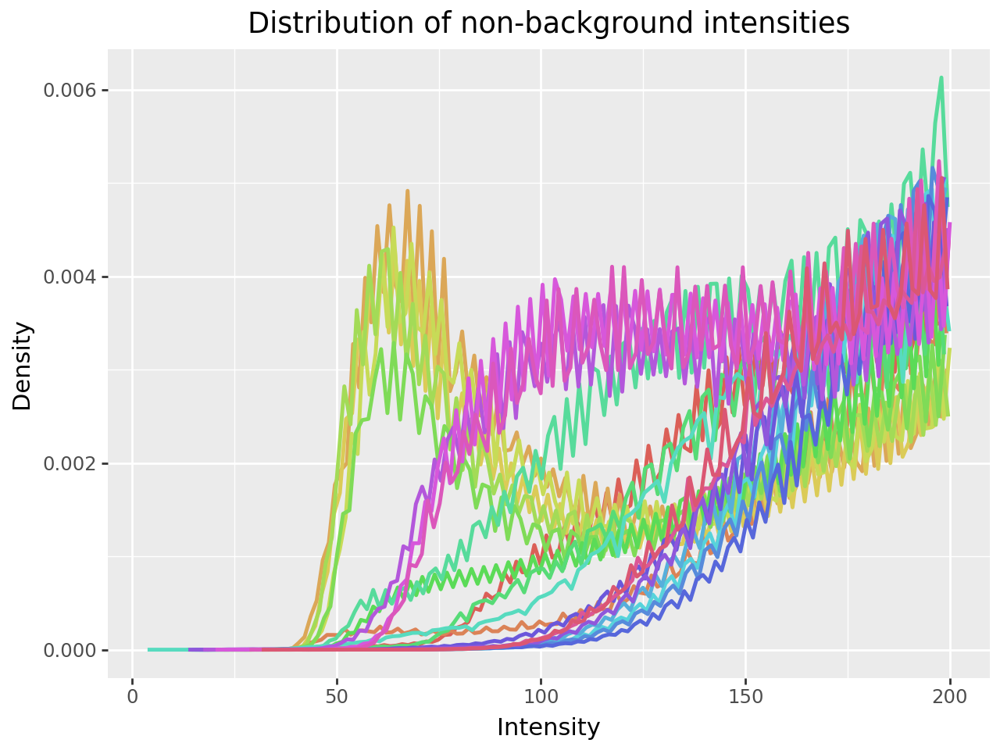

In [17]:
df_plot = pd.concat(distributions).reset_index(drop=True)
plot = (
    p9.ggplot(df_plot[df_plot.Intensity < 200], p9.aes(x="Intensity", y="Density", color = "img")) +
    p9.geom_line(size=1) +  # Line connecting histogram tops
    p9.labs(title="Distribution of non-background intensities", x="Intensity", y="Density")  +
    p9.theme(legend_position='none')
)

plot

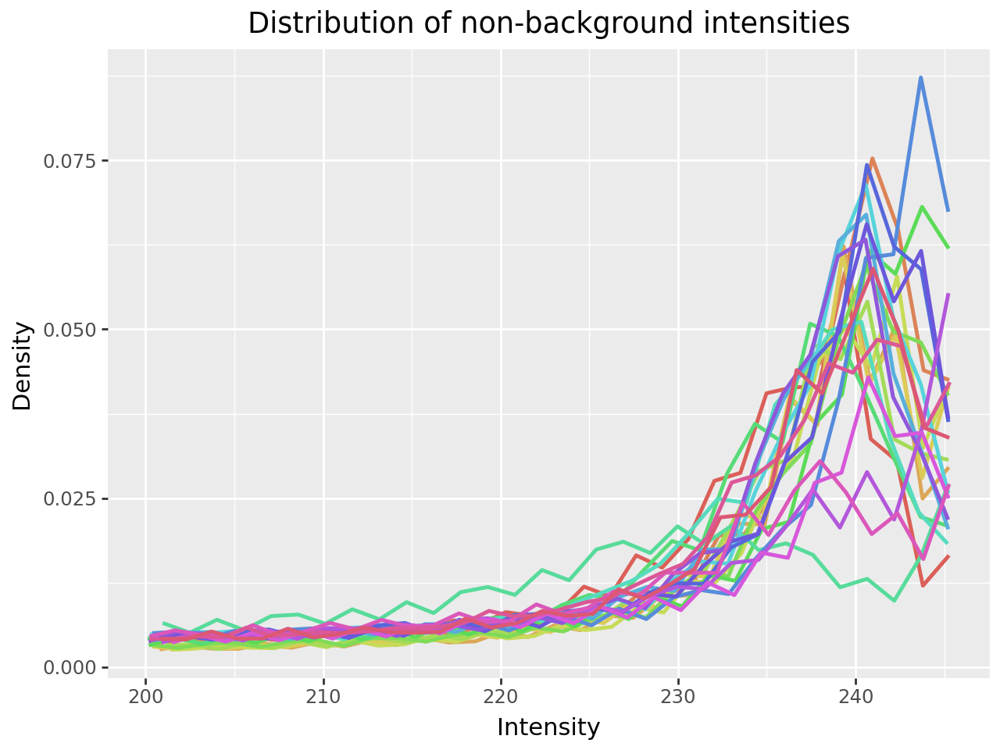

In [18]:
plot = (
    p9.ggplot(df_plot[df_plot.Intensity > 200], p9.aes(x="Intensity", y="Density", color = "img")) +
    p9.geom_line(size=1) +  # Line connecting histogram tops
    p9.labs(title="Distribution of non-background intensities", x="Intensity", y="Density")  +
    p9.theme(legend_position='none')
)

plot

#### plot the means

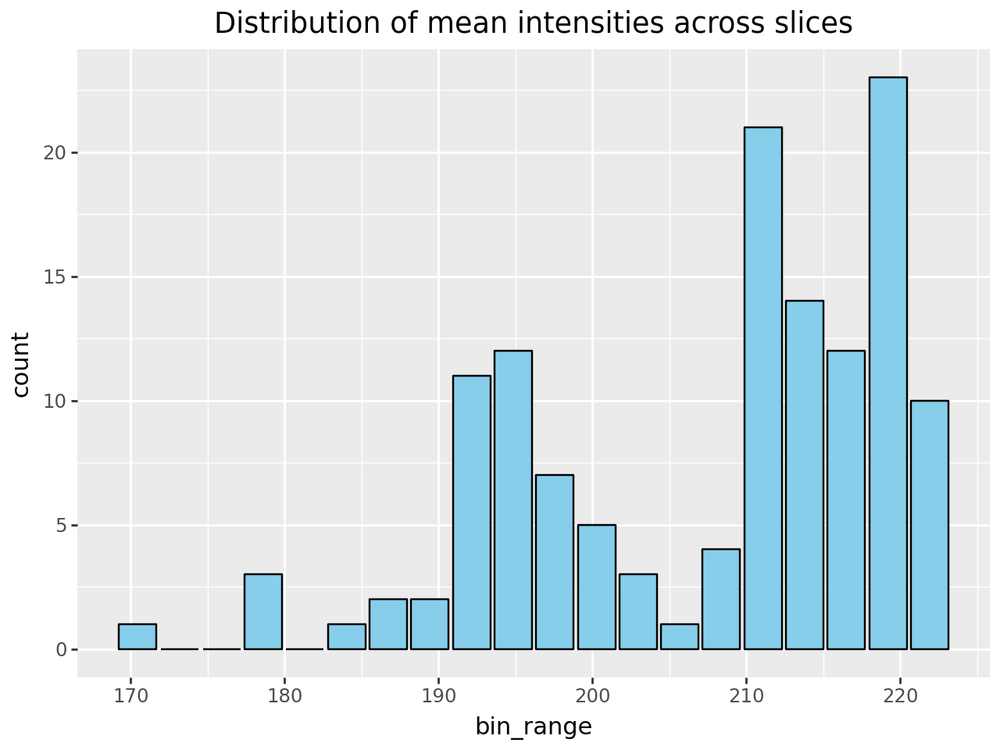

In [56]:
means = [np.mean(img[img <= t]) for img in images]
df_freq = pd.DataFrame({'mean_values': pd.cut(means, bins=20)})  # Binning for readability
df_freq = df_freq['mean_values'].value_counts().reset_index()
df_freq.columns = ['bin_range', 'count']
df_freq["bin_range"] = df_freq["bin_range"].astype(str).str.extract(r'\(([\d.]+),')[0].astype(float)

# Plot using plotnine
plot = (
    p9.ggplot(df_freq, p9.aes(x='bin_range', y='count')) +
    p9.geom_bar(stat="identity", fill="skyblue", color="black") +
    p9.ggtitle("Distribution of mean intensities across slices")
)
plot

Normalize to mean of means and mean of standard deviations

In [18]:
channel_means = [0, 0, 0]
channel_stds = [1, 1, 1]
for channel in (0,1,2):    
    channel_imgs = [img[:, :, channel] for img in images]
    channel_means[channel] = np.mean([np.mean(img[img <= t]) for img in channel_imgs])
    channel_stds[channel] = np.mean([np.std(img[img <= t]) for img in channel_imgs])
channel_means, channel_stds

([112.85539220450501, 108.05511025450015, 116.98236447086418],
 [107.23412524063676, 105.37495043821588, 109.98924003583186])

Separating background from foreground is tough just using a threshold. So I switched to using the centroids from the csv file as follows

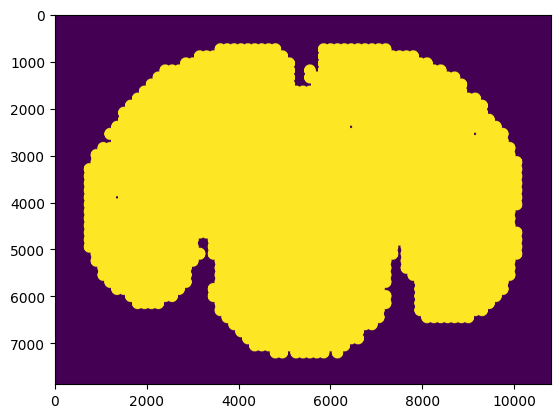

In [20]:
def create_centroid_mask(image_shape, centroids, max_distance=128):
    """
    Create a mask where pixels within max_distance of at least one centroid are included.
    
    Parameters:
        image_shape (tuple): Shape of the image (height, width).
        centroids (list of tuples): List of (row, col) centroid coordinates.
        max_distance (int): Maximum allowed distance from any centroid.
    
    Returns:
        mask (numpy array): Boolean mask with True for included pixels.
    """
    # Create an empty binary image with the same shape as the target image
    binary_centroids = np.zeros(image_shape, dtype=bool)
    
    # Mark centroid locations as True
    for y, x in centroids:
        binary_centroids[y, x] = True  # Ensure centroids are within bounds
    
    # Compute Euclidean distance transform
    distance_map = distance_transform_edt(~binary_centroids)  # Distance from centroids
    
    # Create mask: Include pixels where distance <= max_distance
    mask = distance_map <= max_distance
    
    return mask

# Example usage
image = img_sample.copy()
image_shape = (512, 512)  # Example image size
centroids = [ast.literal_eval(centroid) for centroid in df_sample["pixel_coord"]]
centroids = [(int(centroid["center_y"]), int(centroid["center_x"])) for centroid in centroids]
mask = create_centroid_mask(image.shape[0:2], centroids)

plt.imshow(mask, aspect="auto")  
plt.show()

In [47]:
images = []
titles = []
for img_path in tqdm(os.listdir(image_path)):
    if img_path.startswith("."):
        continue   
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        img = np.array(Image.open(os.path.join(image_path, img_path)))
        images.append(img)
        titles.append(img_path.split(".")[0])

100%|██████████| 133/133 [01:16<00:00,  1.73it/s]


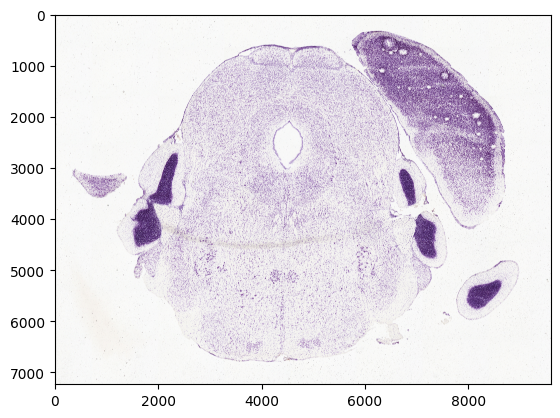

In [100]:
image = images[2].copy()
image[:, :, 0][mask] = 0

plt.imshow(image, aspect="auto")  
plt.show()

In [49]:
scaled_images_path = "/p/project1/hai_fzj_bda/koenig8/histo/data/scaled_images"
scaled_images = []
masks = []

for i in tqdm(range(len(images))):
    # print("Image nr", titles[i])
    image = images[i].copy().astype(float)
    df_image = df[df.image_nr == int(titles[i])]
    # For centroid mask
    centroids = [ast.literal_eval(centroid) for centroid in df_image["pixel_coord"]]
    centroids = [(int(centroid["center_y"]), int(centroid["center_x"])) for centroid in centroids]
    mask = create_centroid_mask(image.shape[0:2], centroids)
    masks.append(mask)
    # print("\t #centroids", len(centroids))
    
    for channel in (0,1,2):
        original_mean = np.mean(image[:, :, channel][mask].flatten())
        original_std = np.std(image[:, :, channel][mask].flatten())
        image[:, :, channel][mask] = (image[:, :, channel][mask] - original_mean) / original_std
        #image[:, :, channel][mask] = (image[:, :, channel][mask] * channel_stds[channel]) + channel_means[channel]
        # Just scale it back to 255 and cast to int
        min_val = np.min(image[:, :, channel][mask])
        max_val = np.max(image[:, :, channel][mask])
        #print("\t min", min_val, "max", max_val)
        image[:, :, channel][mask] = (image[:, :, channel][mask] - min_val) / (max_val - min_val)
        image[:, :, channel][mask] = image[:, :, channel][mask] * 255


    if (np.min(image) != 0.0 or np.max(image) != 255.0):
        print("\t min", np.min(image), "max", np.max(image))
    image  = image.astype(np.uint8)
    
        
    # Save the scaled image
    scaled_images.append(image)
    filepath = os.path.join(scaled_images_path, ".".join([titles[i], "jpg"]))
    Image.fromarray(image).save(filepath)
    

100%|██████████| 132/132 [15:22<00:00,  6.99s/it]


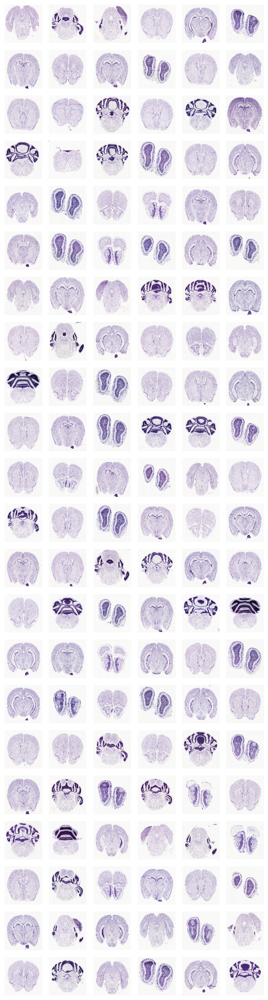

In [53]:
rows, cols = 22, 6
# rows, cols = 1, 4
figsize = (6, 22)
# figsize = (12, 3)
fig, axes = plt.subplots(rows, cols, figsize=figsize)  # Adjust figsize for spacing

# Loop through all images and plot them
for ax, img in zip(axes.ravel(), scaled_images):
    ax.imshow(img, aspect="auto")  # Display image
    ax.axis("off")  # Remove axis for cleaner look

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

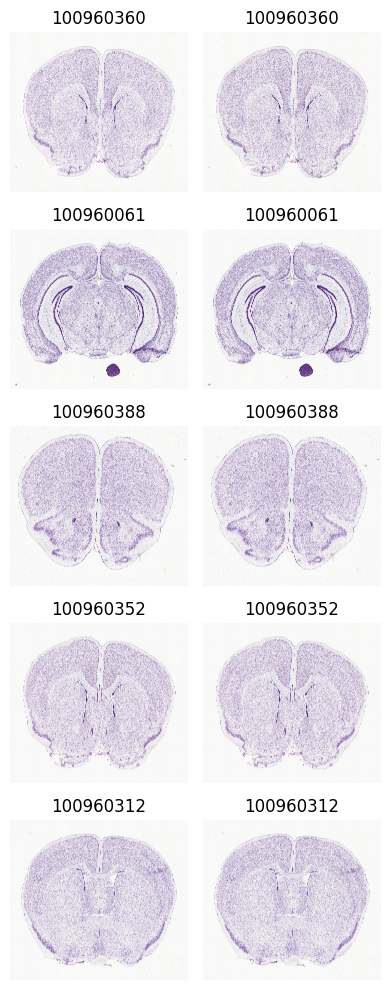

In [52]:
# Look at side to side comparison of random images
from random import sample
n = len(images)
rows, cols = 5, 2
figsize = (4, 10)
sample_ind = sample(list(range(n)), 5)
sample_ind = [x for x in sample_ind for _ in range(2)]
use_scaled = False

fig, axes = plt.subplots(rows, cols, figsize=figsize)
for ax, i in zip(axes.ravel(), sample_ind):
    if use_scaled:
        img = scaled_images[i]
    else:
        img = images[i]
    use_scaled = !use_scaled
    ax.imshow(img, aspect="auto")  # Display image
    ax.set_title(str(titles[i]))  # Set title
    ax.axis("off")  # Hide axis labels

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

100%|██████████| 132/132 [00:45<00:00,  2.93it/s]


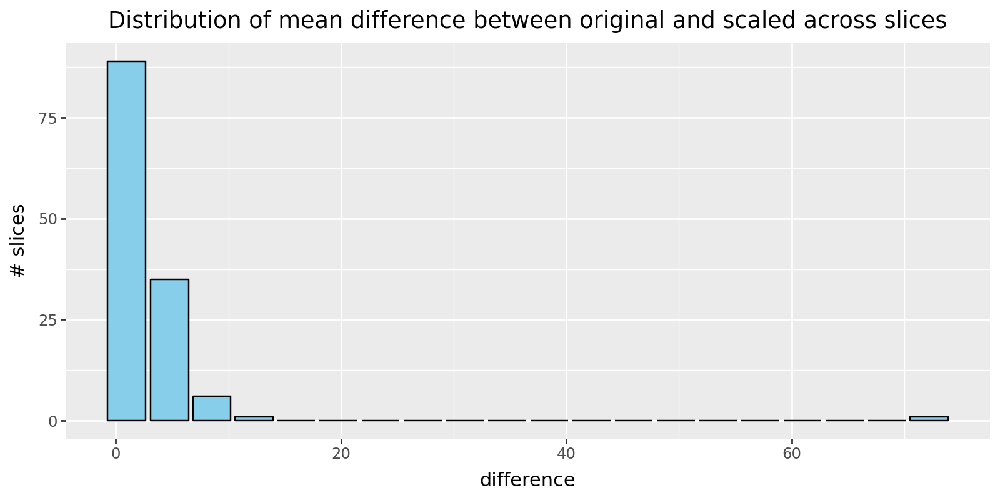

In [61]:
# Calculate the distances between the image and scaled images
differences = []
for i in tqdm(range(len(images))):
    img = images[i]
    scaled_img = scaled_images[i]
    mask = masks[i]
    diff = 0
    for c in [0,1,2]:
        diff += np.abs(np.mean(img[:, :, c][mask] - scaled_img[:, :, c][mask]))
    differences.append(diff / 3)

df_freq = pd.DataFrame({'differences': pd.cut(differences, bins=20)})  # Binning for readability
df_freq = df_freq['differences'].value_counts().reset_index()
df_freq.columns = ['difference', '# slices']
df_freq["difference"] = df_freq["difference"].astype(str).str.extract(r'\(([\d.]+),')[0].astype(float)

# Plot using plotnine
plot = (
    p9.ggplot(df_freq, p9.aes(x='difference', y='# slices')) +
    p9.geom_bar(stat="identity", fill="skyblue", color="black") +
    p9.ggtitle("Distribution of mean difference between original and scaled across slices")+
    p9.theme(figure_size=(8, 4))
)
plot

==> The Normalization did change the intensity values in general, there is one outlier with very high difference

### Normalization Outlier in 100960098

/tmp/ipykernel_11397/3672778077.py:1: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)


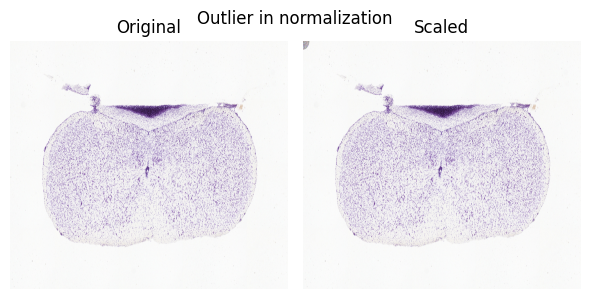

In [67]:
outlier_index = int(np.where(np.array(differences) > 60)[0])
img = images[outlier_index]
scaled_img = scaled_images[outlier_index]

rows, cols = 1, 2
figsize = (6, 3)

fig, axes = plt.subplots(rows, cols, figsize=figsize)
for ax, i, title in zip(axes.ravel(), [img, scaled_img], ("Original", "Scaled")):
    ax.imshow(i, aspect="auto")  # Display image
    ax.set_title(title)  # Set title
    ax.axis("off")  # Hide axis labels

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

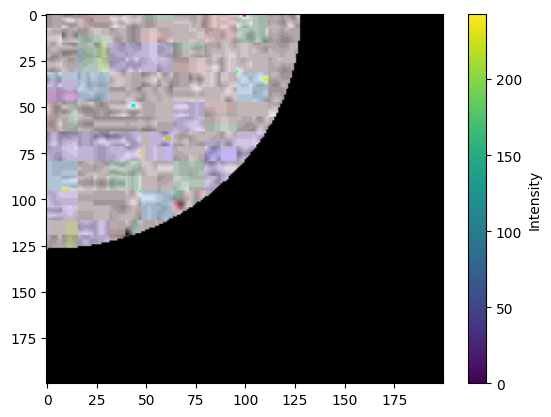

In [75]:
# Upper left corner has weird stuff
w = 200
plt.imshow(scaled_img[0:w, 0:w, :] - img[0:w, 0:w, :], aspect="auto", cmap='viridis')  
plt.colorbar(label="Intensity")  # Add a colorbar
plt.show()

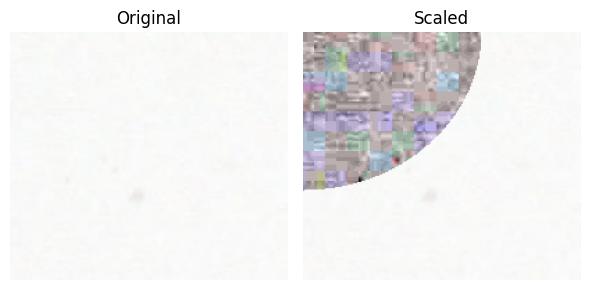

In [79]:
rows, cols = 1, 2
figsize = (6, 3)

fig, axes = plt.subplots(rows, cols, figsize=figsize)
for ax, i, title in zip(axes.ravel(), [img, scaled_img], ("Original", "Scaled")):
    ax.imshow(i[0:w, 0:w, :], aspect="auto")  # Display image
    ax.set_title(title)  # Set title
    ax.axis("off")  # Hide axis labels


plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()